In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from IPython.display import display
from tqdm.notebook import tqdm 

In [2]:
def Pi(p:np.ndarray) -> np.ndarray:
    """convert from homogeneous coordinates to inhomogeneous coordinates

    subtract one coordinate"""
    if isinstance(p, np.ndarray):
        return p[:-1]/p[-1]
    elif isinstance(p, list):
        return [Pi(np.array(p_)) for p_ in p]

def PiInv(p:np.ndarray) -> np.ndarray:
    """convert from inhomogeneous coordinates to homogeneous coordinates

    add one coordinate with value 1"""
    if isinstance(p, np.ndarray):
        return np.vstack((p, np.ones(p.shape[1])))
    elif isinstance(p, list):
        return [PiInv(np.array(p_)) for p_ in p]

def projectpoints(K, R, t, Q):
    """project 3D points to 2D"""
    Rt = np.concatenate((R, t), axis=1)
    return Pi(K @ Rt @ PiInv(Q))
    
def crossOp(a:np.ndarray) -> np.ndarray:
    """crossproduct operator"""
    x = a[0].item()
    y = a[1].item()
    z = a[2].item()
    return np.array([[0, -z, y], [z, 0, -x], [-y, x, 0]])

def compute_fundamental_matrix(K1, K2, R2, t2):
    """compute fundamental matrix from camera matrices"""
    E = crossOp(t2) @ R2
    F = np.linalg.inv(K2).T @ E @ np.linalg.inv(K1)
    return F

def SampsonsDistance(F, p1, p2):
    """Sampson's distance"""
    # TODO: scale? to a^2+b^2=1
    return (p2.T @ F @ p1)**2 / ((p2.T @ F)[0]**2 + (p2.T @ F)[1]**2 + (F @ p1)[0]**2 + (F @ p1)[1]**2)
    
def randomly_draw_four_points(points):
    """Draws eight random points from a set of points"""
    # replace must be false, to avoid fitting a line through the same point twice
    return np.random.choice(points, 4, replace=False)
    
def Fest_8point(q1:np.ndarray, q2:np.ndarray) -> np.ndarray:
    """compute fundamental matrix from 8 point correspondences
    points: list of tuples of 2d points (q1, q2)"""
    N = q1.shape[1]
    K = q1.shape[0]
    B = np.zeros((N, K**2))
    for i, (q1, q2) in enumerate(zip(q1.T, q2.T)):
        q1 = q1.reshape(-1, 1) # make column vector to make the matrix multiplication work
        q2 = q2.reshape(-1, 1)
        B[i, :] = (q2 @ q1.T).flatten()
    U, S, Vh = np.linalg.svd(B)
    V = Vh.T
    F = V[:,-1].reshape(3, 3)
    return F

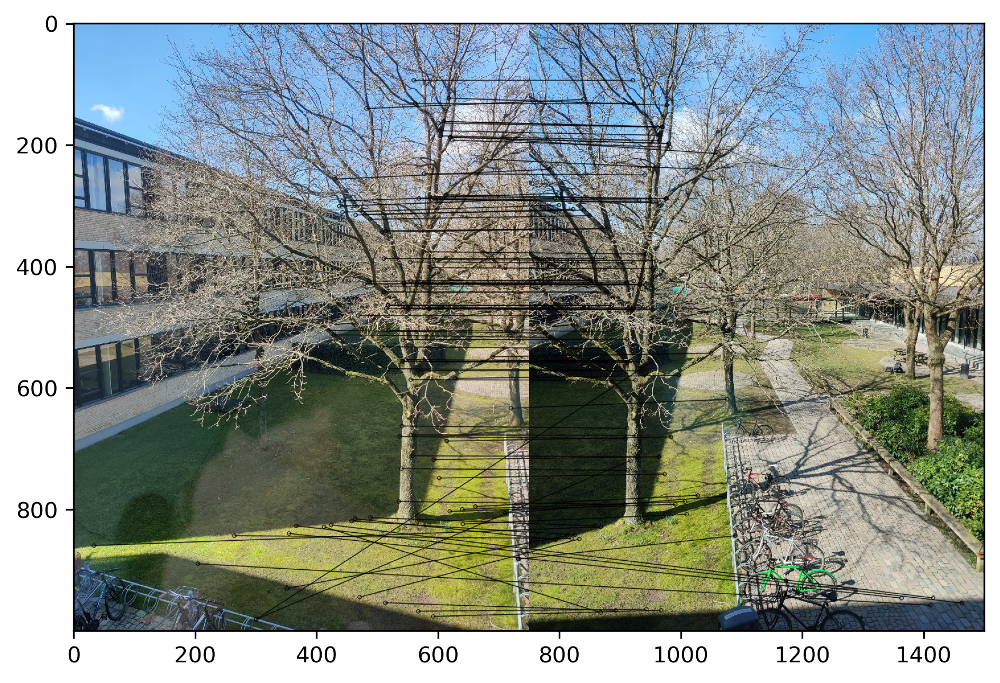

In [3]:
# 10.1
im1 = cv2.imread('data/im1.jpg')[:,:,::-1]
im2 = cv2.imread('data/im2.jpg')[:,:,::-1]
# im1 = im1.mean(2).astype(np.uint8)
# im2 = im2.mean(2).astype(np.uint8)

sift = cv2.SIFT_create()
kp1, des1 = sift.detectAndCompute(im1, None)
kp2, des2 = sift.detectAndCompute(im2, None)
bf = cv2.BFMatcher_create(crossCheck=True)
matches = bf.match(des2, des1)

matches = sorted(matches, key = lambda x:x.distance)
# draw first 100 matches. to not pollute the image too much
img3 = cv2.drawMatches(im2, kp2, im1, kp1, matches[:100], None, 1, flags=2)
fig, ax = plt.subplots(dpi=300, tight_layout=True)
ax.imshow(img3, cmap='gray');

In [18]:
def dist_app(H, p1, p2):
    """distance approximation for RANSAC"""
    # convert to homogeneous coordinates to match the lecture notes
    p1 = PiInv(p1)
    p2 = PiInv(p2)
    return np.linalg.norm(Pi(H @ p2) - Pi(p1))**2 + np.linalg.norm(Pi(np.linalg.inv(H) @ p1) - Pi(p2))**2
    
def hest(q1, q2):
    """estimate homography from 2 sets of points"""
    N = q1[0].shape[0]+1
    K = len(q1)
    B = np.zeros((N*K, N**2))
    def cross_up(x:np.ndarray):
        x1i = x[0].item()
        y1i = x[1].item()
        return np.array([[0, -1, y1i], [1, 0, -x1i], [-y1i, x1i, 0]])

    for i, (q1, q2) in enumerate(zip(q1, q2)):
        q1 = PiInv(q1); q2 = PiInv(q2)
        B[i*N:(i+1)*N] = np.kron(q2.T, cross_up(q1))
    U, S, Vh = np.linalg.svd(B)
    V = Vh.T
    H = V[:,-1].reshape(3,3).T
    H /= -0.01*np.linalg.norm(B) # this is not necessary, i just do it to make the result the same as the H matrix as before and I just guessed the scaling
    return H

In [22]:
# 10.2
def RANSAC(points, threshold, max_iter, adaptive=True, p=0.99):
    """Runs the RANSAC algorithm to estimate a Fundamental matrix from a set of matches
    
    Parameters
    ----------
    points: array of shape (2, n)
        The points from which to estimate a line
    threshold: float
        The threshold for the distance of a point to the line
    min_points: int
        The minimum number of points that need to be inliers for the algorithm to stop
    max_iter: int
        The maximum number of iterations the algorithm will run
    lstsq_fit: bool
        If True, the final line will be estimated using a least squares fit to the inliers of the best model
    adaptive: bool
        If True, the number of iterations will be adapted to the probability that a random sample is free of outliers
    p: float
        The probability that a random sample is free of outliers
        only relevant if adaptive is True
    
    Returns
    -------
    best_line: array of shape (3,)
        The line that was estimated by the RANSAC algorithm
    best_inliers: array of shape (n,)
        The indices of the points that were inliers of the best line
    """
    n = 2 # since we sample two points to fit a line
    best_H = None
    best_consensus = 0
    N_hat = max_iter
    i = 0
    pbar = tqdm(total=max_iter)

    q1_all = []
    q2_all = []
    for match in points:
        q1_all.append(np.array(kp2[match.queryIdx].pt).reshape(-1, 1))
        q2_all.append(np.array(kp1[match.trainIdx].pt).reshape(-1, 1))

    while (i < max_iter and i < N_hat):
        four_random_matches = randomly_draw_four_points(points)
        q1 = []
        q2 = []

        # it's ok to use the sampled points again, then we are just guaranteed to always have at least 4 inliers
        for match in four_random_matches:
            q1.append(np.array(kp2[match.queryIdx].pt).reshape(-1, 1))
            q2.append(np.array(kp1[match.trainIdx].pt).reshape(-1, 1))

        Hest = hest(q1, q2)

        distances = [dist_app(Hest, p1, p2) for p1, p2, in zip(q1_all, q2_all)]
        inliers = np.where(np.abs(distances) < threshold)[0]
        cons = len(inliers)
        if cons > best_consensus:
            best_consensus = cons
            best_H = Hest
            best_inliers = inliers
        if adaptive:
            m = len(points)
            s = best_consensus
            e_hat = 1 - s/m
            N_hat = np.log(1-p)/np.log((1-(1-e_hat)**n))
        i += 1
        pbar.update(1)
    # final step: re-estimate H using all inliers of best model
    q1_final = []
    q2_final = []
    for idx in best_inliers:
        q1_final.append(np.array(kp2[points[idx].queryIdx].pt).reshape(-1, 1))
        q2_final.append(np.array(kp1[points[idx].trainIdx].pt).reshape(-1, 1))
    
    Hest = hest(q1_final, q2_final)

    return best_H, best_inliers

# 3.84*3**2 comes from the 95% confidence interval of the chi2 distribution with 1 degrees of freedom and a sigma of 3

H, inliers = RANSAC(matches, 3.84*3**2, 200, adaptive=False, p=0.99)

  0%|          | 0/200 [00:00<?, ?it/s]

949

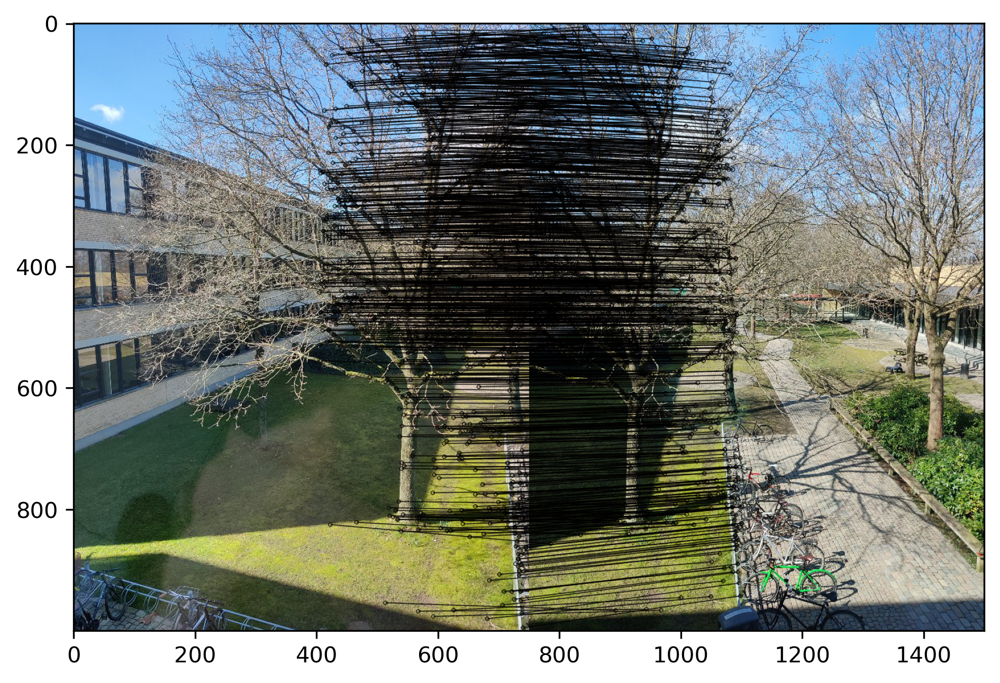

In [23]:
inlier_matches = np.array(matches)[inliers]
display(len(inlier_matches))
img3 = cv2.drawMatches(im2, kp2, im1, kp1, inlier_matches, None, 1, flags=2)
fig, ax = plt.subplots(dpi=300, tight_layout=True)
ax.imshow(img3, cmap='gray');

In [24]:
# 10.3 
def estHomographyRANSAC(kp1, des1, kp2, des2):
    """Estimate homography using RANSAC"""
    bf = cv2.BFMatcher_create(crossCheck=True)
    matches = bf.match(des2, des1)
    H, _ = RANSAC(matches, 3.84*3**2, 200, adaptive=False, p=0.99)

    return H

In [238]:
# 10.6 automatic xRange and yRange
def get_ranges(H, im1, im2):
    """Get the ranges of the image after applying the homography"""
    points = [np.array([[-im2.shape[1]],[0]]), 
              np.array([[im1.shape[1]],[0]]),
              np.array([[0],[im1.shape[0]]]),
              np.array([[im1.shape[1]],[im1.shape[0]]])]

    corners = []
    for point in PiInv(points):
        corners.append(H @ point)
    corners = Pi(corners)
    xs = [corner[0] for corner in corners]
    ys = [corner[1] for corner in corners]
    xRange = [int(min(xs)), int(max(xs))]
    yRange = [int(min(ys)), int(max(ys))]
    return xRange, yRange

In [239]:
# 10.4
def warpImage(im, H, xRange, yRange):
    T = np.eye(3)
    T[:2, 2] = [-xRange[0], -yRange[0]]
    H = T @ H
    outSize = (xRange[1] - xRange[0], yRange[1]-yRange[0])
    mask = np.ones(im.shape[:2], dtype=np.uint8)*255
    imWarp = cv2.warpPerspective(im, H, outSize)
    maskWarp = cv2.warpPerspective(mask, H, outSize)
    return imWarp, maskWarp

xRange, yRange = get_ranges(H, im1,im2)
# xRange = [0, im2.shape[1]+im1.shape[1]] 
# yRange = [0, im1.shape[0]]
im1_w, mask1 = warpImage(im1, H, xRange, yRange)
# xRange, yRange = get_ranges(H, im2)
# xRange = [0, xRange[0]+xRange[1]]
# yRange = [yRange[0], yRange[1]]
# xRange = [0, im2.shape[1]+im1.shape[1]] 
# yRange = [0, im1.shape[0]]
im2_w, mask2 = warpImage(im2, np.eye(3), xRange, yRange)

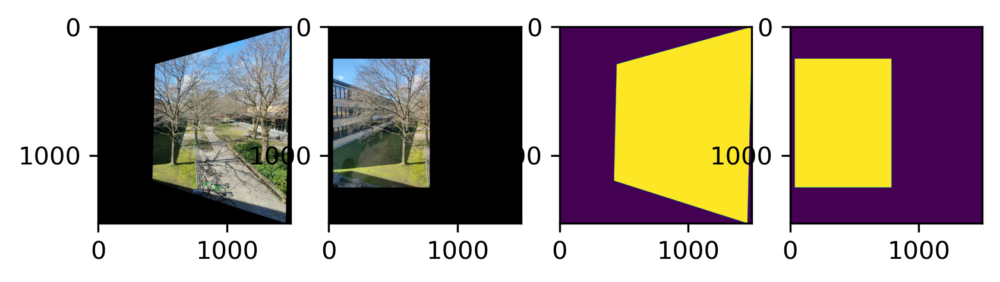

In [240]:
fig, ax = plt.subplots(1,4,dpi=300)
ax[0].imshow(im1_w)
ax[1].imshow(im2_w)
ax[2].imshow(mask1)
ax[3].imshow(mask2)

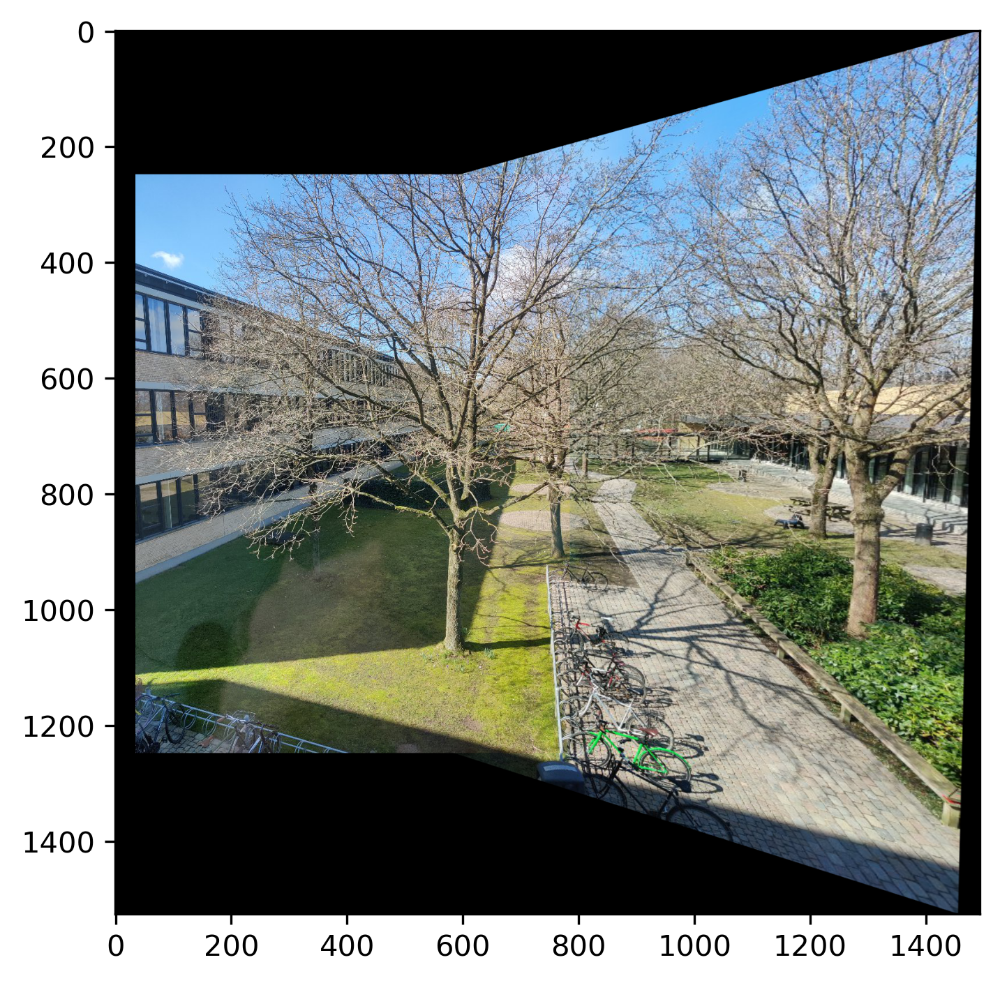

In [241]:
# 10.5
def blendImagePair(im1, im2, mask1, mask2):
    """Blend two images using the given masks"""
    im1[np.where(mask2 == 255)] = 0
    blended = im2+im1
    return blended
im3 = blendImagePair(im1_w, im2_w, mask1, mask2)
fig, ax = plt.subplots(dpi=300, tight_layout=True)
ax.imshow(im3);

Man kan godt se en linje hvor de to billeder mødes med hinanden

In [ ]:
# 10.7 Optional: expand algorithm to handle three or more images
